In [1]:
import os, sys
import h5py
import numpy as np
import pandas as pd
from scipy.interpolate import InterpolatedUnivariateSpline
from scipy import optimize
import matplotlib.pyplot as plt
from scipy import integrate
from scipy.optimize import curve_fit
from scipy.stats import norm
import matplotlib.font_manager as font_manager
from tqdm.autonotebook import tqdm
from matplotlib.backends.backend_pdf import PdfPages
import time
from scipy.optimize import curve_fit
from scipy.stats import norm
from scipy import stats
import scipy.stats
import pickle
import math

import etroc1_array

C:\Users\qsun\AppData\Local\Continuum\anaconda3\lib\site-packages\tqdm\autonotebook.py:17: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
######### read data of Pixel 0 back from files ###########
path = './data/Q_DAC_Scan_1M25'

folders = os.listdir(path)
print(folders)

print(folders[1].split('.')[1])

folders1 = []
for item in folders:
    if item.split('=')[1]!='1M25.zip':
        folders1 += [item]

# print('folders1 was',folders1)

def myFunc(e):
  return len(e)

folders1.sort(key=myFunc)
print('folders1 is',folders1)

# print(folders[0].split('_')[2])

toa_rb_list=[]
toa_mu_rb_list=[]
toa_std_rb_list = []
tot_rb_list=[]
tot_mu_rb_list=[]
tot_std_rb_list = []
cal_rb_list=[]
cal_mu_rb_list=[]
cal_std_rb_list = []
hitposition_mod_rb_list = []
phase_rb_list = []
DAC_rb_list = []
hits_rb_list = []

for item in folders1:
    with open(path+'/'+ item+'/'+'toa_file.list', 'rb') as f:
        toa_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'toa_mu_file.list', 'rb') as f:
        toa_mu_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'toa_std_file.list', 'rb') as f:
        toa_std_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'tot_file.list', 'rb') as f:
        tot_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'tot_mu_file.list', 'rb') as f:
        tot_mu_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'tot_std_file.list', 'rb') as f:
        tot_std_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'cal_file.list', 'rb') as f:
        cal_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'cal_mu_file.list', 'rb') as f:
        cal_mu_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'cal_std_file.list', 'rb') as f:
        cal_std_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'hitposition_mod_file.list', 'rb') as f:
        hitposition_mod_rb_list.append(pickle.load(f))
    # with open(path+'/'+'phase_file.list', 'rb') as f:
    #     phase_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'DAC_file.list', 'rb') as f:
        DAC_rb_list.append(pickle.load(f))
    with open(path+'/'+ item+'/'+'hits_file.list', 'rb') as f:
        hits_rb_list.append(pickle.load(f))
    # print(len(hits_rb_list[0][0]))
    # print(toa_mu_rb_list)



['Jitter_Performance_P0_QInj=1M25', 'Jitter_Performance_P0_QInj=1M25.zip', 'Jitter_Performance_P10_QInj=1M25', 'Jitter_Performance_P10_QInj=1M25.zip', 'Jitter_Performance_P11_QInj=1M25', 'Jitter_Performance_P11_QInj=1M25.zip', 'Jitter_Performance_P12_QInj=1M25', 'Jitter_Performance_P12_QInj=1M25.zip', 'Jitter_Performance_P13_QInj=1M25', 'Jitter_Performance_P13_QInj=1M25.zip', 'Jitter_Performance_P14_QInj=1M25', 'Jitter_Performance_P14_QInj=1M25.zip', 'Jitter_Performance_P15_QInj=1M25', 'Jitter_Performance_P15_QInj=1M25.zip', 'Jitter_Performance_P1_QInj=1M25', 'Jitter_Performance_P1_QInj=1M25.zip', 'Jitter_Performance_P2_QInj=1M25', 'Jitter_Performance_P2_QInj=1M25.zip', 'Jitter_Performance_P3_QInj=1M25', 'Jitter_Performance_P3_QInj=1M25.zip', 'Jitter_Performance_P4_QInj=1M25', 'Jitter_Performance_P4_QInj=1M25.zip', 'Jitter_Performance_P5_QInj=1M25', 'Jitter_Performance_P5_QInj=1M25.zip', 'Jitter_Performance_P6_QInj=1M25', 'Jitter_Performance_P6_QInj=1M25.zip', 'Jitter_Performance_P7_QI

In [3]:
print(len(cal_rb_list[0][1][5]))

pix=1
index_2fC=11
calCode = []
calCode = cal_rb_list[pix][3][index_2fC]

# print(calCode)

138579


In [4]:
dac_num = len(hits_rb_list[0][0])
print(dac_num)
# print('hits:',hits_rb_list)
######## find out the start point and transition point  ############
Qinj = ['4 fC', '5 fC', '6 fC', '8 fC', '10 fC', '15 fC', '20 fC']
Qinj_fC = [4,5,6,8,10,15,20]

DAC_AllPix_start_list = []
DAC_AllPix_transition_list = []
toa_bin_allP = []
toa_bin_std_allP = []
toa_jitter_code_allP = []
tot_jitter_code_allP = []
toa_jitter_ps_allP = []
tot_jitter_ps_allP = []
index_slice=[]

toa_bin_list_allP= []
for pix in range(0,len(hits_rb_list)):
    
    DAC_P0_start_list = []
    DAC_P0_transition_list = []
    item_num = 0
    for h in range(0,len(Qinj)):
        dac_transition = 0
        dac_num = len(hits_rb_list[pix][h])
        if hits_rb_list[pix][h][dac_num-1] == 0:
            s_curve_found = 0
            for i in range(0,dac_num):
                if hits_rb_list[pix][h][dac_num-1-i] > 0 and s_curve_found==0:
                    dac_transition = dac_num-1-i - 1
                    s_curve_found = 1
                if hits_rb_list[pix][h][dac_num-1-i] > 6250 and s_curve_found==1:
                    dac_start = dac_num-1-i+1
                    break
                else:
                    dac_start = dac_transition - 50
            if s_curve_found == 1:
                DAC_P0_start_list.append(dac_start)
                DAC_P0_transition_list.append(dac_transition)
            item_num += 1
    DAC_AllPix_start_list.append(DAC_P0_start_list)
    DAC_AllPix_transition_list.append(DAC_P0_transition_list)

#     print('transition points at Pixel',pix, 'are',DAC_AllPix_transition_list[pix])
#     print('starting points at Pixel',pix,'are',DAC_AllPix_start_list[pix])

#     index_2fC=2*DAC_AllPix_transition_list[pix][0] - DAC_AllPix_transition_list[pix][2]   #  2 fC
#     index_2fC=DAC_AllPix_transition_list[pix][0]- \
#              (DAC_AllPix_transition_list[pix][2]-DAC_AllPix_transition_list[pix][1])   #  3 fC
    
    
    ind_diff_1fC_list=[DAC_AllPix_transition_list[pix][1]-DAC_AllPix_transition_list[pix][0],
                  DAC_AllPix_transition_list[pix][2]-DAC_AllPix_transition_list[pix][1]]
    ind_diff_1fC=np.min(ind_diff_1fC_list)
    index_2fC=DAC_AllPix_transition_list[pix][0]-ind_diff_1fC      # new 3fC
#     print('index_2fC at',pix,'=',index_2fC)
    
    index_slice.append(index_2fC)
    ################### find out TOA bin size ##########################
    calCode = []
#     for m in range(0,len(Qinj)):
#         calCode = calCode + [cal_mu_rb_list[pix][m][index_2fC]]
    calCode = cal_rb_list[pix][2][index_2fC]
    #     print(cal_mu_rb_list[0][m][index])
#     print('calCode is',calCode)
#     calCode_mu=np.mean(calCode)
#     calCode_std=np.std(calCode)
#     print('calCode mean is', calCode_mu)
    toa_bin_list = []
    for item in calCode:
        toa_bin_list.append(3125/item)
    toa_bin_list_allP.append(toa_bin_list)
    toa_bin = np.mean(toa_bin_list)
    toa_bin_std = 1*np.std(toa_bin_list)
#     print('toa_bin is',toa_bin)
    toa_bin_allP.append(toa_bin)
    toa_bin_std_allP.append(toa_bin_std)
    
    ################### find out jitter at 2 fC TH########################
    toa_jitter_code = []
    tot_jitter_code = []
    toa_jitter_ps = []
    tot_jitter_ps = []
    
    for m in range(0,len(Qinj_fC)):
        toa_jitter_code += [toa_std_rb_list[pix][m][index_2fC]]
        tot_jitter_code += [tot_std_rb_list[pix][m][index_2fC]]
        toa_jitter_ps += [toa_std_rb_list[pix][m][index_2fC]*toa_bin]
        tot_jitter_ps += [(tot_std_rb_list[pix][m][index_2fC]*2-math.floor(tot_std_rb_list[pix][m][index_2fC]))*toa_bin]
    
    toa_jitter_code_allP.append(toa_jitter_code)
    tot_jitter_code_allP.append(tot_jitter_code)
    toa_jitter_ps_allP.append(toa_jitter_ps)
    tot_jitter_ps_allP.append(tot_jitter_ps)

# print('toa jitter in code is',toa_jitter_code_allP)
# print('tot jitter in code is',tot_jitter_code_allP)
# print('toa jitter in ps is',toa_jitter_ps_allP)
# print('tot jitter in ps is',tot_jitter_ps_allP)
# print(len(DAC_rb_list))
# print(DAC_rb_list[0][0])
# print(toa_rb_list[2][2][index_slice[2]])
ftest=1.12345567
print('ftest is %.2f'%ftest)
print(DAC_AllPix_transition_list)
print(index_slice)
print(toa_bin_list_allP[0][0:100])

97
ftest is 1.12
[[21, 24, 28, 37, 45, 68, 94], [14, 17, 20, 25, 31, 47, 65], [19, 23, 27, 34, 40, 60, 79], [16, 19, 22, 26, 32, 49, 68], [30, 34, 39, 49, 59, 83, 109], [18, 22, 25, 30, 37, 56, 81], [20, 23, 28, 34, 40, 58, 78], [29, 34, 40, 49, 61, 92, 125], [20, 23, 27, 32, 37, 55, 75], [20, 23, 26, 32, 38, 56, 78], [22, 25, 28, 33, 39, 57, 79], [19, 22, 28, 34, 40, 61, 82], [23, 26, 29, 37, 42, 62, 83], [20, 23, 26, 36, 43, 63, 83], [17, 20, 24, 31, 37, 54, 76], [27, 30, 35, 41, 49, 72, 101]]
[18, 11, 15, 13, 26, 15, 17, 24, 17, 17, 19, 16, 20, 17, 14, 24]
[18.27485380116959, 18.27485380116959, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.16860465116279, 18.16860465116279, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.16860465116279, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.16860465116279, 18.27485380116959, 18.27485380116959, 18.27485380116959, 18.27485380116959, 18.27485380116959, 18.168604651162

[  69    0    0 3634    0    0 2430    0    0  117]
[107.  107.3 107.6 107.9 108.2 108.5 108.8 109.1 109.4 109.7 110. ]
[103 104 105 106 107 108 109 110 111 112]
[18.27485380116959, 18.27485380116959, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.27485380116959, 18.16860465116279, 18.16860465116279, 18.16860465116279, 18.16860465116279]
[18.063583815028903, 18.063583815028903, 17.95977011494253, 17.95977011494253, 17.95977011494253, 18.063583815028903, 17.95977011494253, 17.95977011494253, 18.063583815028903, 17.95977011494253]
6250


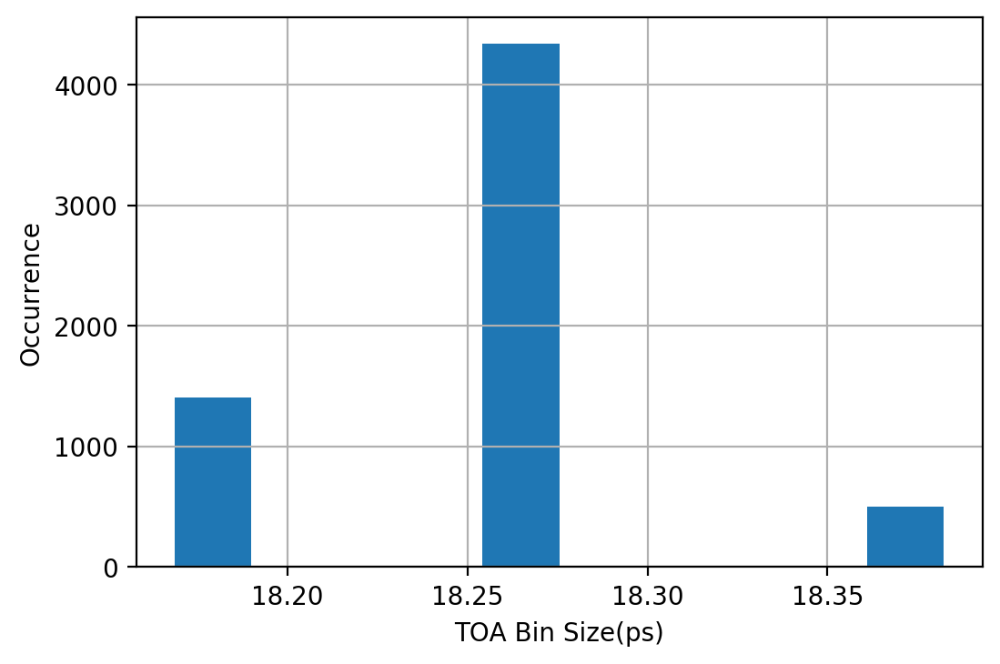

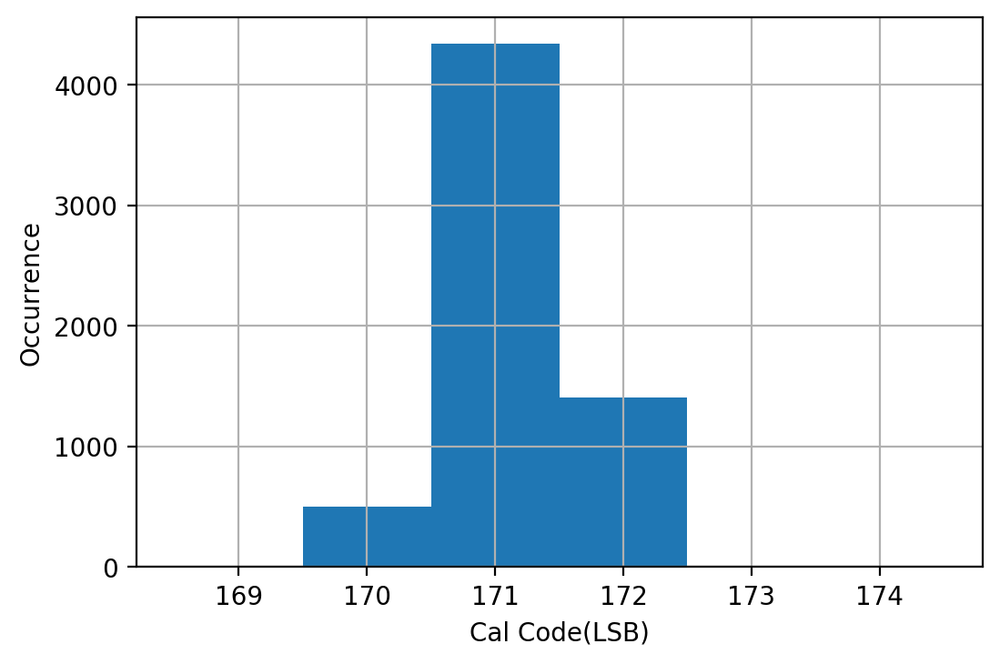

[171, 172, 171, 172, 171, 170, 172, 171, 171, 172, 171, 171, 171, 171, 171, 172, 172, 172, 171, 171, 171, 171, 171, 171, 171, 171, 172, 171, 171, 171, 172, 171, 171, 171, 172, 170, 171, 171, 171, 171, 171, 171, 171, 171, 170, 172, 172, 171, 172, 171, 171, 172, 170, 172, 170, 172, 171, 171, 171, 171, 171, 172, 172, 170, 172, 171, 171, 171, 171, 171, 170, 172, 170, 170, 171, 171, 171, 171, 172, 171, 171, 172, 171, 171, 171, 171, 171, 171, 171, 171, 172, 171, 171, 171, 171, 171, 171, 171, 171, 171]


In [5]:
# example data
mu = 100  # mean of distribution
sigma = 15  # standard deviation of distribution
x = mu + sigma * np.random.randn(1437)

# print(x)
# plt.hist(x)
# hist,bins=np.histogram(x,bins=20)
# print(hist)
# print(bins)
# print(np.arange(math.floor(np.min(bins)),math.floor(np.max(bins))))

pix=2
hist0,bins0=np.histogram(toa_rb_list[pix][2][index_slice[pix]],bins=10)
bins_plot=np.arange(math.floor(bins0[5])-5,math.floor(bins0[5])+5)
print(hist0)
print(bins0)
print(bins_plot)

print(toa_bin_list_allP[0][0:10])
print(toa_bin_list_allP[3][0:10])

print(len(toa_bin_list_allP[0]))

# plt.hist(toa_bin_list_allP[1])

fig1, ax1 = plt.subplots(dpi=200)
ax1.hist(toa_bin_list_allP[15],align='mid')
ax1.set(xlabel='TOA Bin Size(ps)', ylabel='Occurrence')
ax1.grid()

plt.show()
plt.close(fig1)

pix=15

fig1, ax1 = plt.subplots(dpi=200)
hist0,bins0=np.histogram(cal_rb_list[pix][2][index_slice[pix]],bins=10)
bins_plot=np.arange(math.floor(bins0[5])-2,math.floor(bins0[5])+5)
ax1.hist(cal_rb_list[pix][2][index_slice[pix]],bins=bins_plot, align='left')
ax1.set(xlabel='Cal Code(LSB)', ylabel='Occurrence')
ax1.grid()

plt.show()
plt.close(fig1)

print(cal_rb_list[pix][2][index_slice[pix]][0:100])

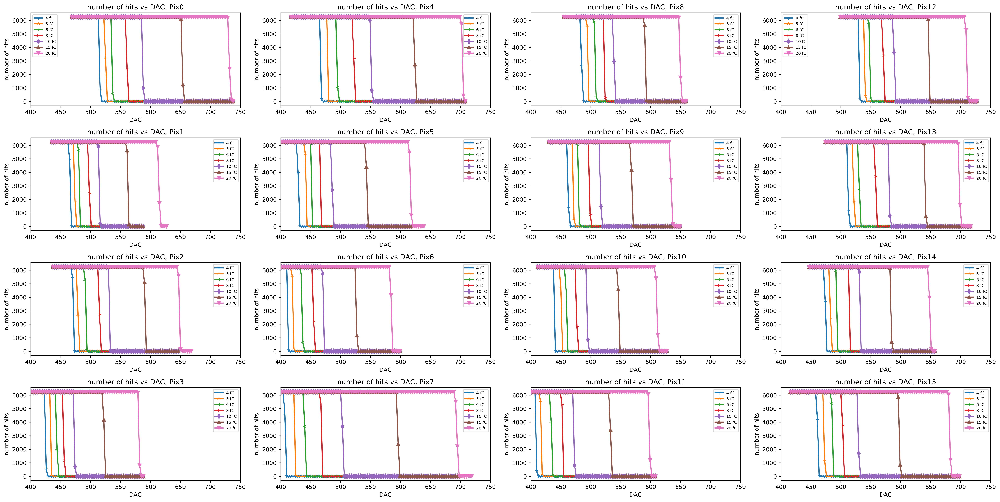

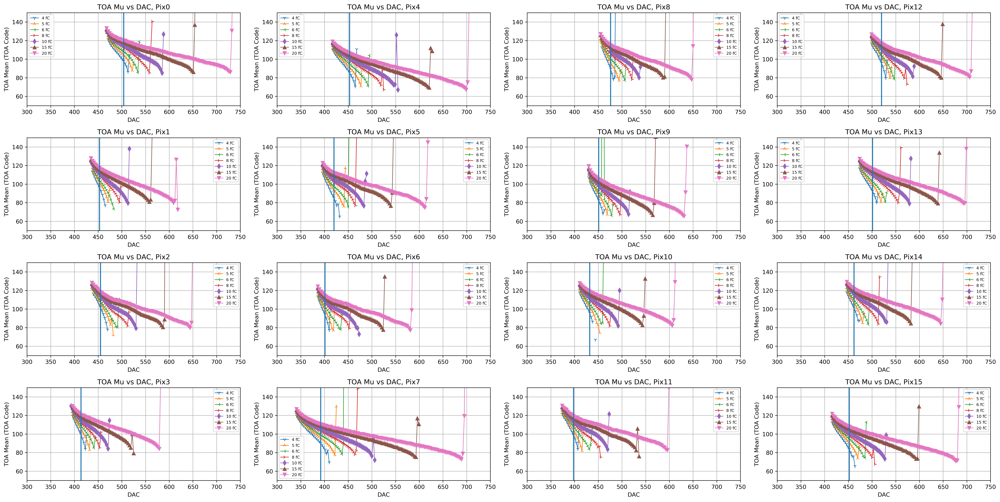

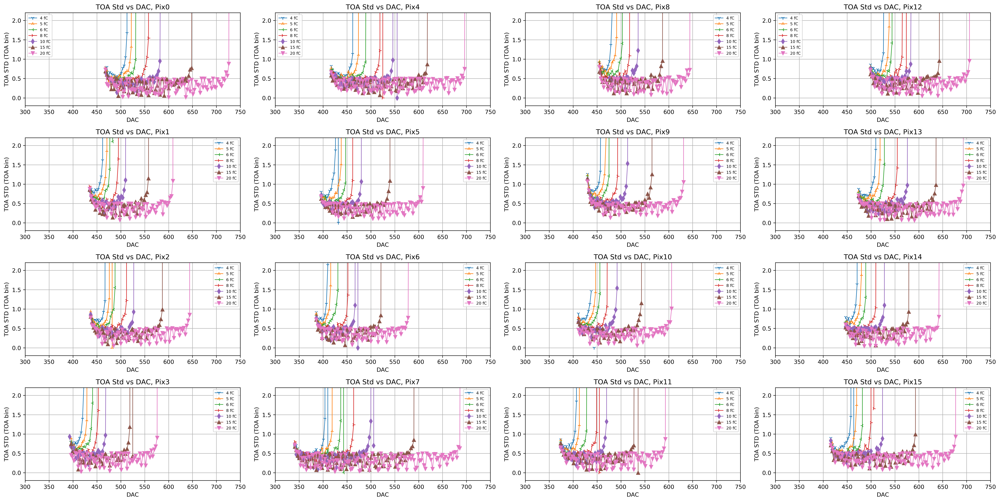

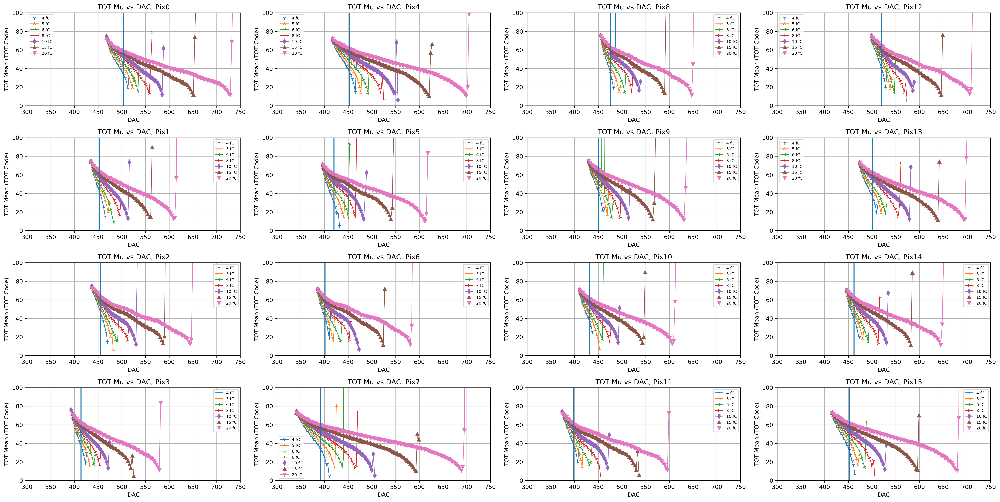

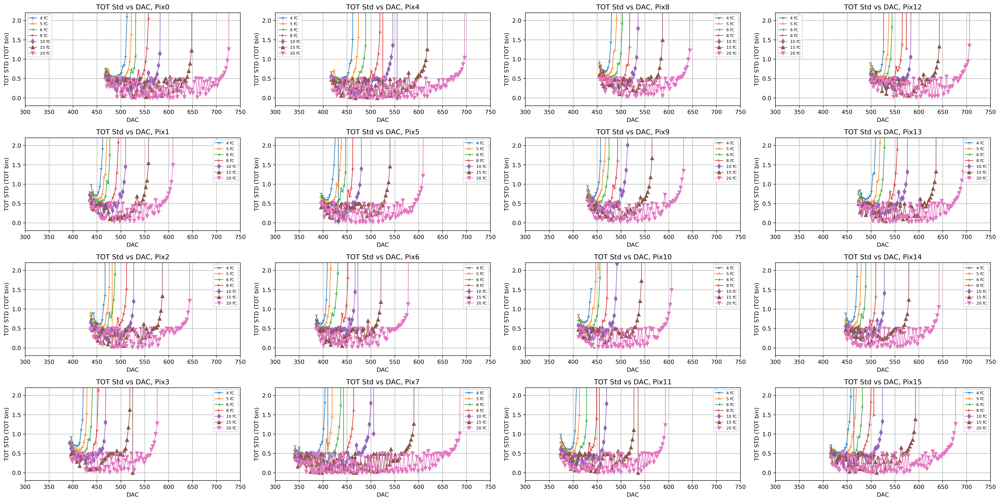

...

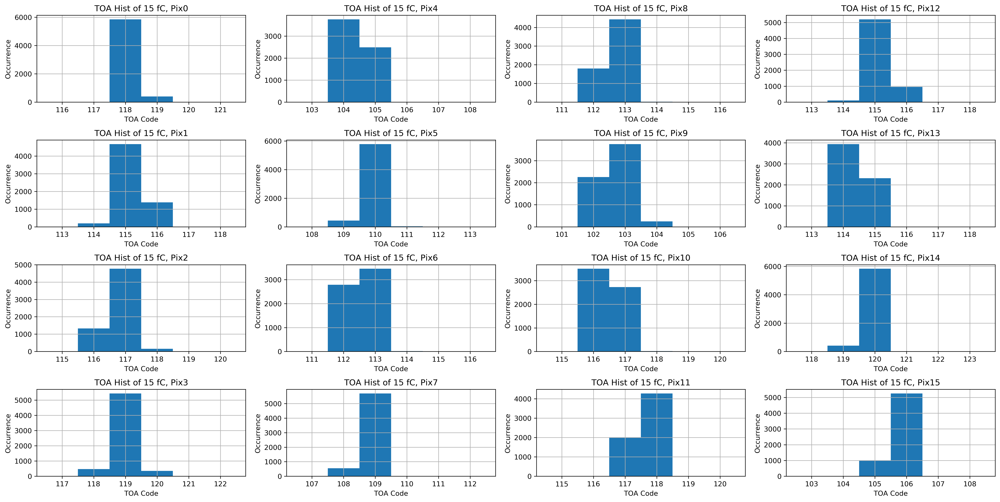

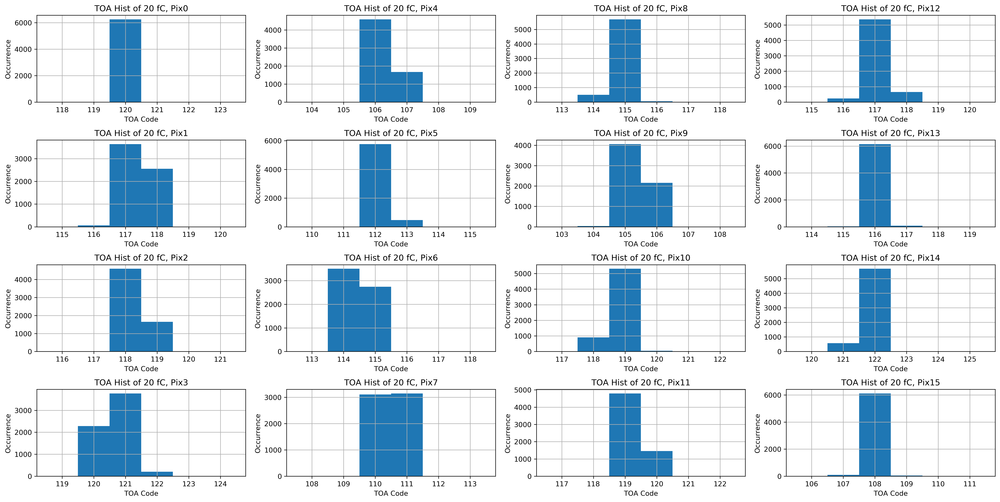

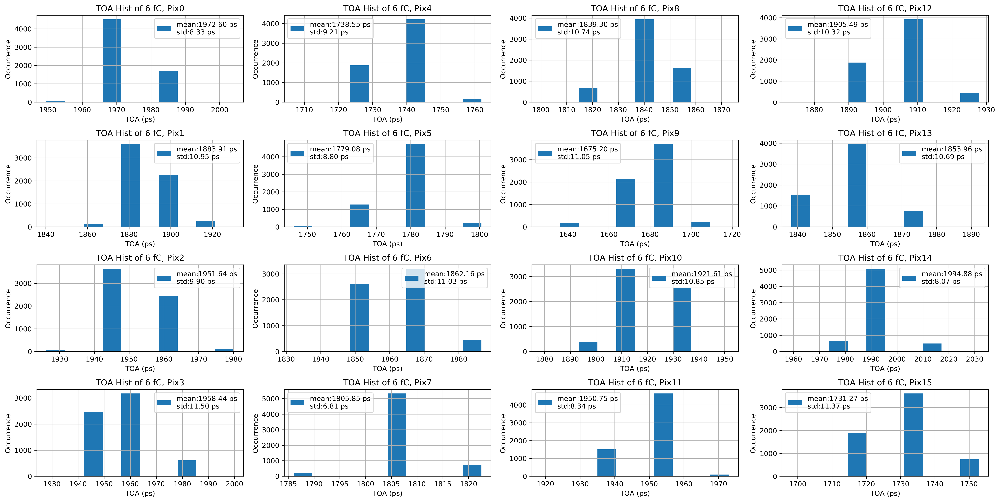

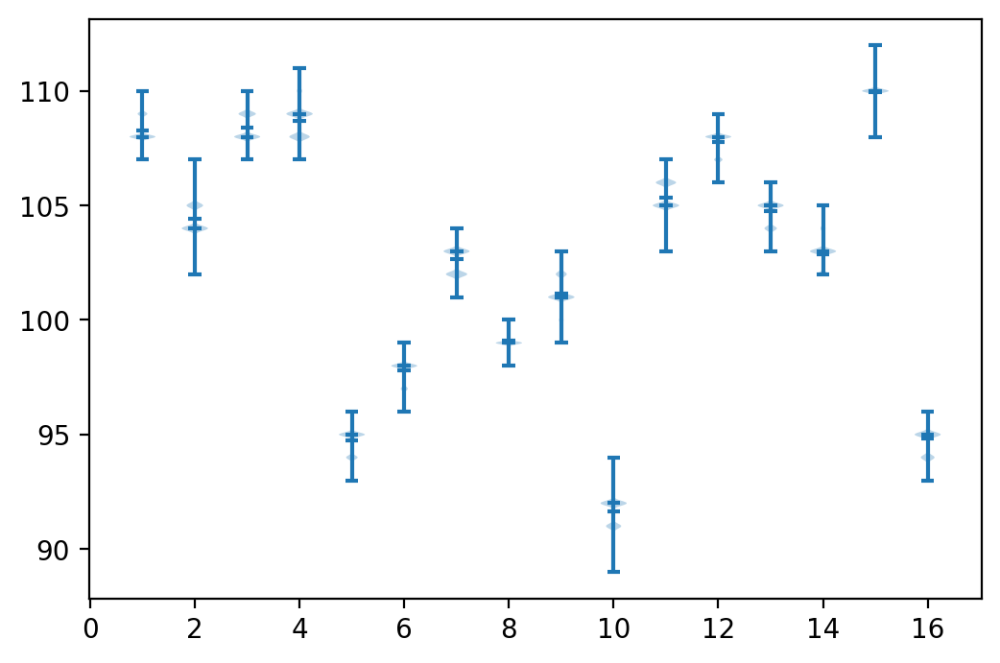

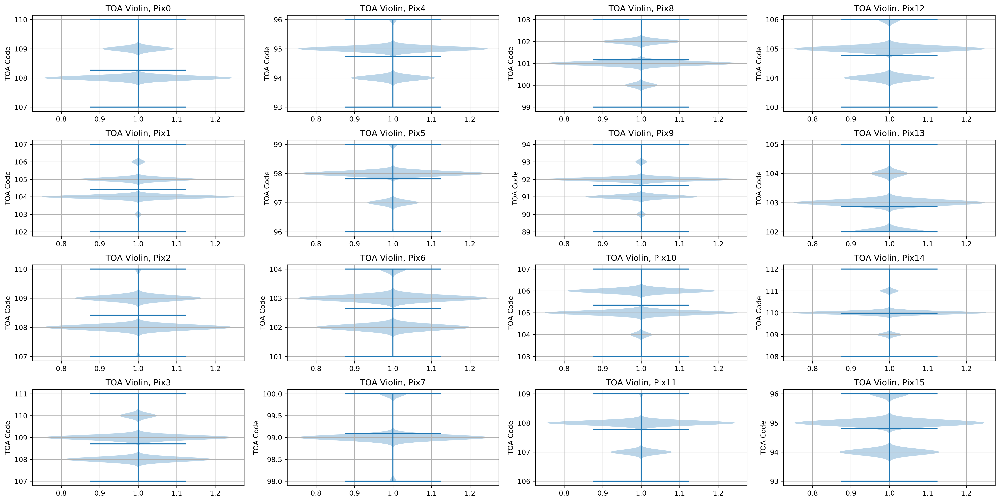

NameError: name 'heatmap' is not defined

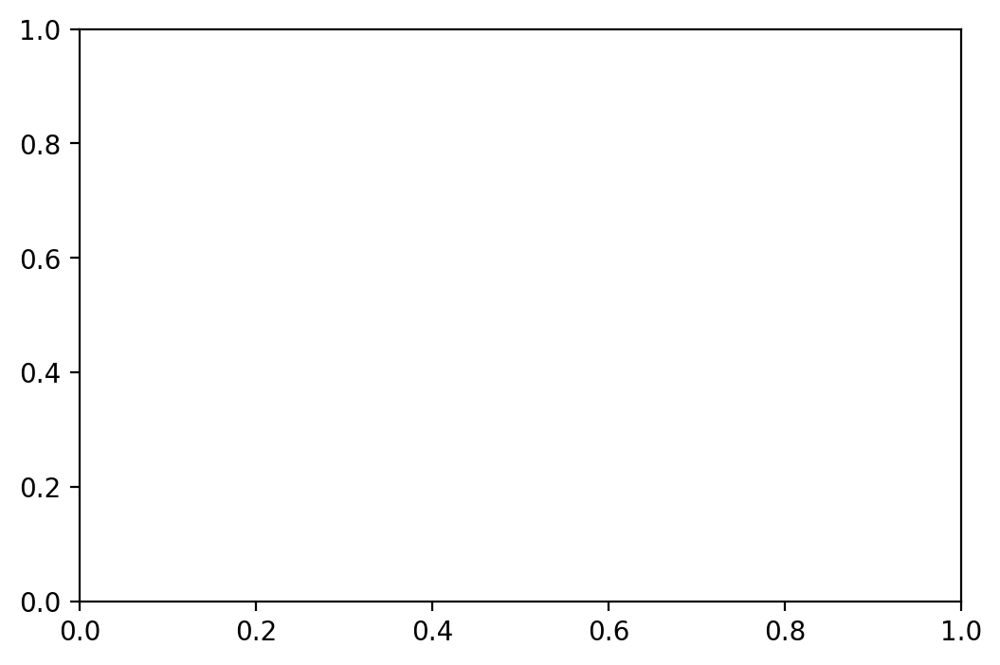

In [6]:
import itertools
# marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))

#######################  plot  ############################################
######### Plot hits vs DAC  ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(24, 12),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))
    for i in range(0,len(Qinj)):
        ax1[pix%4][pix//4].plot(DAC_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],hits_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],
                 marker = next(marker), linestyle='-',linewidth=2, label=Qinj[i] )
        ax1[pix%4][pix//4].set(xlabel='DAC', ylabel='number of hits',
       title='number of hits vs DAC, Pix%d'%pix)
        ax1[pix%4][pix//4].set_xlim(left=400,right=750)
        ax1[pix%4][pix//4].legend(loc='best', fontsize = 'x-small')

plt.show()
plt.close(fig1)

######### Plot toa vs DAC  ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(24, 12),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))
    for i in range(0,len(Qinj)):
        ax1[pix%4][pix//4].plot(DAC_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],toa_mu_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],
                 marker = next(marker), linestyle='-',linewidth=1, label=Qinj[i] )
        ax1[pix%4][pix//4].axvline(DAC_rb_list[pix][i][index_slice[pix]])
        ax1[pix%4][pix//4].set(xlabel='DAC', ylabel='TOA Mean (TOA Code)',
       title='TOA Mu vs DAC, Pix%d'%pix)
        ax1[pix%4][pix//4].set_xlim(left=300,right=750)
        ax1[pix%4][pix//4].legend(loc='best', fontsize = 'x-small')
        ax1[pix%4][pix//4].set_ylim(bottom=50,top=150)
        ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(24, 12),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))
    for i in range(0,len(Qinj)):
        ax1[pix%4][pix//4].plot(DAC_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],toa_std_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],
                 marker = next(marker), linestyle='-',linewidth=1, label=Qinj[i] )
        ax1[pix%4][pix//4].set(xlabel='DAC', ylabel='TOA STD (TOA bin)',
       title='TOA Std vs DAC, Pix%d'%pix)
        ax1[pix%4][pix//4].set_xlim(left=300,right=750)
        ax1[pix%4][pix//4].legend(loc='best', fontsize = 'x-small')
        ax1[pix%4][pix//4].set_ylim(bottom=-0.2,top=2.2)
        ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)


######### Plot tot vs DAC  ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(24, 12),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))
    for i in range(0,len(Qinj)):
        ax1[pix%4][pix//4].plot(DAC_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],tot_mu_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],
                 marker = next(marker), linestyle='-',linewidth=1, label=Qinj[i] )
        ax1[pix%4][pix//4].axvline(DAC_rb_list[pix][i][index_slice[pix]])
        ax1[pix%4][pix//4].set(xlabel='DAC', ylabel='TOT Mean (TOT Code)',
       title='TOT Mu vs DAC, Pix%d'%pix)
        ax1[pix%4][pix//4].set_xlim(left=300,right=750)
        ax1[pix%4][pix//4].legend(loc='best', fontsize = 'x-small')
        ax1[pix%4][pix//4].set_ylim(bottom=0,top=100)
        ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(24, 12),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    marker = itertools.cycle(('1', '2', '3', '4', 'd','^','v','*','x','s','p'))
    for i in range(0,len(Qinj)):
        ax1[pix%4][pix//4].plot(DAC_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],tot_std_rb_list[pix][i][DAC_AllPix_start_list[pix][i]:],
                 marker = next(marker), linestyle='-',linewidth=1, label=Qinj[i] )
        ax1[pix%4][pix//4].set(xlabel='DAC', ylabel='TOT STD (TOT bin)',
       title='TOT Std vs DAC, Pix%d'%pix)
        ax1[pix%4][pix//4].set_xlim(left=300,right=750)
        ax1[pix%4][pix//4].legend(loc='best', fontsize = 'x-small')
        ax1[pix%4][pix//4].set_ylim(bottom=-0.2,top=2.2)
        ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

######### Plot TOA Bins  ##############
fig, ax1 = plt.subplots(dpi=200)
pix_index = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15]
ax1.errorbar(pix_index,toa_bin_allP,toa_bin_std_allP , marker='o', linestyle='-', linewidth=1, label='TDC bin size')
# i=15
# ax1.plot(DAC_10fC_list[i], hits_10fC_list[i], linewidth=1, label=pixel_index_list[i] )
ax1.set_ylim(bottom=10,top=30)
ax1.grid()
ax1.set(xlabel='Pixel', ylabel='TOA bin(ps)',
       title='TOA bin size')
ax1.legend()
plt.show()
plt.close(fig)

######### Plot 6 fC TOA hist code ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    hist0,bins0=np.histogram(toa_rb_list[pix][2][index_slice[pix]],bins=10)
    bins_plot=np.arange(math.floor(bins0[5])-2,math.floor(bins0[5])+5)
    ax1[pix%4][pix//4].hist(toa_rb_list[pix][2][index_slice[pix]],bins=bins_plot,align='left')
    ax1[pix%4][pix//4].set(xlabel='TOA Code', ylabel='Occurrence',
      title='TOA Hist of 6 fC, Pix%d'%pix)
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

######### Plot 15 fC TOA hist code ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    hist0,bins0=np.histogram(toa_rb_list[pix][5][index_slice[pix]],bins=10)
    bins_plot=np.arange(math.floor(bins0[5])-2,math.floor(bins0[5])+5)
    ax1[pix%4][pix//4].hist(toa_rb_list[pix][5][index_slice[pix]],bins=bins_plot,align='left')
    ax1[pix%4][pix//4].set(xlabel='TOA Code', ylabel='Occurrence',
      title='TOA Hist of 15 fC, Pix%d'%pix)
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

######### Plot 20 fC TOA hist code ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    hist0,bins0=np.histogram(toa_rb_list[pix][6][index_slice[pix]],bins=10)
    bins_plot=np.arange(math.floor(bins0[5])-2,math.floor(bins0[5])+5)
    ax1[pix%4][pix//4].hist(toa_rb_list[pix][6][index_slice[pix]],bins=bins_plot,align='left')
    ax1[pix%4][pix//4].set(xlabel='TOA Code', ylabel='Occurrence',
      title='TOA Hist of 20 fC, Pix%d'%pix)
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

######### Plot 6 fC TOA hist ps ##############
fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    toa_ps_list = []
    for atom in toa_rb_list[pix][2][index_slice[pix]]:
        toa_ps_list.append(atom*toa_bin_allP[pix])
    entries=len(toa_rb_list[pix][2][index_slice[pix]])
    mu=np.mean(toa_ps_list)
    std=np.std(toa_ps_list)
    
    ax1[pix%4][pix//4].hist(toa_ps_list, range=None, density=False, 
                        label = 'mean:%.2f ps\nstd:%.2f ps'%(mu, std), align='mid')
    ax1[pix%4][pix//4].set(xlabel='TOA (ps)', ylabel='Occurrence',
            title='TOA Hist of 6 fC, Pix%d'%pix)
    ax1[pix%4][pix//4].legend()
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)


######## Plot 6 fC TOA violin ###############
toa_violin_plot = []
for pix in range(0,len(hits_rb_list)):
    toa_violin_plot.append(toa_rb_list[pix][2][index_slice[pix]])
fig, ax1 = plt.subplots(dpi=200)
#for pix in range(0,len(hits_rb_list)):
ax1.violinplot(toa_violin_plot,
                   showmeans=True,
                   showmedians=True)
plt.show()
plt.close(fig)


fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,len(hits_rb_list)):
    ax1[pix%4][pix//4].violinplot(toa_rb_list[pix][2][index_slice[pix]],showmeans=True,showmedians=False)
    ax1[pix%4][pix//4].set(ylabel='TOA Code',
       title='TOA Violin, Pix%d'%pix)
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)


######## Plot 6 fC TOA heatmap ###############
row_heatmap = ['Row 0','Row 1','Row 2','Row 3']
col_heatmap = ['Col 0','Col 1','Col 2','Col 3']
toa_mu_heatmap=np.array([[toa_mu_rb_list[0][2][index_slice[0]], toa_mu_rb_list[4][2][index_slice[4]], toa_mu_rb_list[8][2][index_slice[8]], toa_mu_rb_list[12][2][index_slice[12]]],
                [toa_mu_rb_list[1][2][index_slice[1]], toa_mu_rb_list[5][2][index_slice[5]], toa_mu_rb_list[9][2][index_slice[9]], toa_mu_rb_list[13][2][index_slice[13]]],
                [toa_mu_rb_list[2][2][index_slice[2]], toa_mu_rb_list[6][2][index_slice[6]], toa_mu_rb_list[10][2][index_slice[10]], toa_mu_rb_list[14][2][index_slice[14]]],
                [toa_mu_rb_list[3][2][index_slice[3]], toa_mu_rb_list[7][2][index_slice[7]], toa_mu_rb_list[11][2][index_slice[11]], toa_mu_rb_list[15][2][index_slice[15]]]])

fig1, ax = plt.subplots(dpi=200)

im, cbar = etroc1_array.heatmap(toa_mu_heatmap, row_heatmap, col_heatmap, ax=ax,
                   cmap="GnBu", cbarlabel="TOA (LSB)")
texts = etroc1_array.annotate_heatmap(im, valfmt="{x:.1f}")

fig.tight_layout()
plt.show()
plt.close(fig1)


In [ ]:
pix=6
print(tot_rb_list[pix][1][index_slice[pix]][0:100])
print(toa_rb_list[pix][1][index_slice[pix]][0:100])
toa_merged = toa_rb_list[pix][0][index_slice[pix]] + toa_rb_list[pix][1][index_slice[pix]] + toa_rb_list[pix][2][index_slice[pix]] + \
            toa_rb_list[pix][3][index_slice[pix]] + toa_rb_list[pix][4][index_slice[pix]] + toa_rb_list[pix][5][index_slice[pix]] + \
            toa_rb_list[pix][6][index_slice[pix]]
tot_merged = tot_rb_list[pix][0][index_slice[pix]] + tot_rb_list[pix][1][index_slice[pix]] + tot_rb_list[pix][2][index_slice[pix]] + \
            tot_rb_list[pix][3][index_slice[pix]] + tot_rb_list[pix][4][index_slice[pix]] + tot_rb_list[pix][5][index_slice[pix]] + \
            tot_rb_list[pix][6][index_slice[pix]]
toa_code_merged_np = np.array(toa_merged)    # converting to np.array to facilitate processing
tot_code_merged_np = np.array(tot_merged)    # converting to np.array to facilitate processing
length_tot_toa = len(toa_code_merged_np)
toa_merged_np = toa_code_merged_np * toa_bin_allP[pix]
tot_offset = [math.floor(item/32) for item in tot_code_merged_np]
tot_merged_np = (tot_code_merged_np*2 - tot_offset) * toa_bin_allP[pix]
print(toa_bin_allP[pix])
print('tot_merged_np min is',np.min(tot_merged_np))
print('tot_merged min is',np.min(tot_merged))

fig1, ax1 = plt.subplots(nrows=4, ncols=4, figsize=(20,10),constrained_layout=True,dpi=300)
for pix in range(0,16):
    ######  merge toa and tot from different Q  ######
    toa_merged = toa_rb_list[pix][0][index_slice[pix]] + toa_rb_list[pix][1][index_slice[pix]] + toa_rb_list[pix][2][index_slice[pix]] + \
                toa_rb_list[pix][3][index_slice[pix]] + toa_rb_list[pix][4][index_slice[pix]] + toa_rb_list[pix][5][index_slice[pix]] + \
                toa_rb_list[pix][6][index_slice[pix]]
    tot_merged = tot_rb_list[pix][0][index_slice[pix]] + tot_rb_list[pix][1][index_slice[pix]] + tot_rb_list[pix][2][index_slice[pix]] + \
                tot_rb_list[pix][3][index_slice[pix]] + tot_rb_list[pix][4][index_slice[pix]] + tot_rb_list[pix][5][index_slice[pix]] + \
                tot_rb_list[pix][6][index_slice[pix]]
    toa_code_merged_np = np.array(toa_merged)    # converting to np.array to facilitate processing
    tot_code_merged_np = np.array(tot_merged)    # converting to np.array to facilitate processing
    length_tot_toa = len(toa_code_merged_np)
    
    toa_merged_np = toa_code_merged_np * toa_bin_allP[pix]
    tot_offset = [math.floor(item/32) for item in tot_code_merged_np]
    tot_merged_np = (tot_code_merged_np*2 - tot_offset) * toa_bin_allP[pix]
    ax1[pix%4][pix//4].scatter(tot_merged_np,toa_merged_np)
    ax1[pix%4][pix//4].set(xlabel='TOT(ps)', ylabel='TOA (ps)',
       title='TOA vs TOT, Pix%d'%pix)
    ax1[pix%4][pix//4].set_xlim(left=1000,right=2400)
    ax1[pix%4][pix//4].set_ylim(bottom=1400,top=2300)
    ax1[pix%4][pix//4].grid()

plt.show()
plt.close(fig1)

marker = itertools.cycle(('1', '2', '3', '4','8','d','D','^','v','*','x','X','s','p','|','_'))
fig1, ax1 = plt.subplots(dpi=300)
for pix in range(0,16):
    ######  merge toa and tot from different Q  ######
    toa_merged = toa_rb_list[pix][0][index_slice[pix]] + toa_rb_list[pix][1][index_slice[pix]] + toa_rb_list[pix][2][index_slice[pix]] + \
                toa_rb_list[pix][3][index_slice[pix]] + toa_rb_list[pix][4][index_slice[pix]] + toa_rb_list[pix][5][index_slice[pix]] + \
                toa_rb_list[pix][6][index_slice[pix]]
    tot_merged = tot_rb_list[pix][0][index_slice[pix]] + tot_rb_list[pix][1][index_slice[pix]] + tot_rb_list[pix][2][index_slice[pix]] + \
                tot_rb_list[pix][3][index_slice[pix]] + tot_rb_list[pix][4][index_slice[pix]] + tot_rb_list[pix][5][index_slice[pix]] + \
                tot_rb_list[pix][6][index_slice[pix]]
    toa_code_merged_np = np.array(toa_merged)    # converting to np.array to facilitate processing
    tot_code_merged_np = np.array(tot_merged)    # converting to np.array to facilitate processing
    length_tot_toa = len(toa_code_merged_np)
    
    toa_merged_np = toa_code_merged_np * toa_bin_allP[pix]
    tot_offset = [math.floor(item/32) for item in tot_code_merged_np]
    tot_merged_np = (tot_code_merged_np*2 - tot_offset) * toa_bin_allP[pix]
    ax1.scatter(tot_merged_np,toa_merged_np,alpha=0.5,marker=next(marker),label='Pixel %d'%pix)
ax1.set(xlabel='TOT(ps)', ylabel='TOA (ps)',
   title='TOA vs TOT')
ax1.set_xlim(left=1000,right=2400)
ax1.set_ylim(bottom=1400,top=2300)
ax1.grid()
ax1.legend(loc='best', fontsize = 'x-small')

plt.show()
plt.close(fig1)

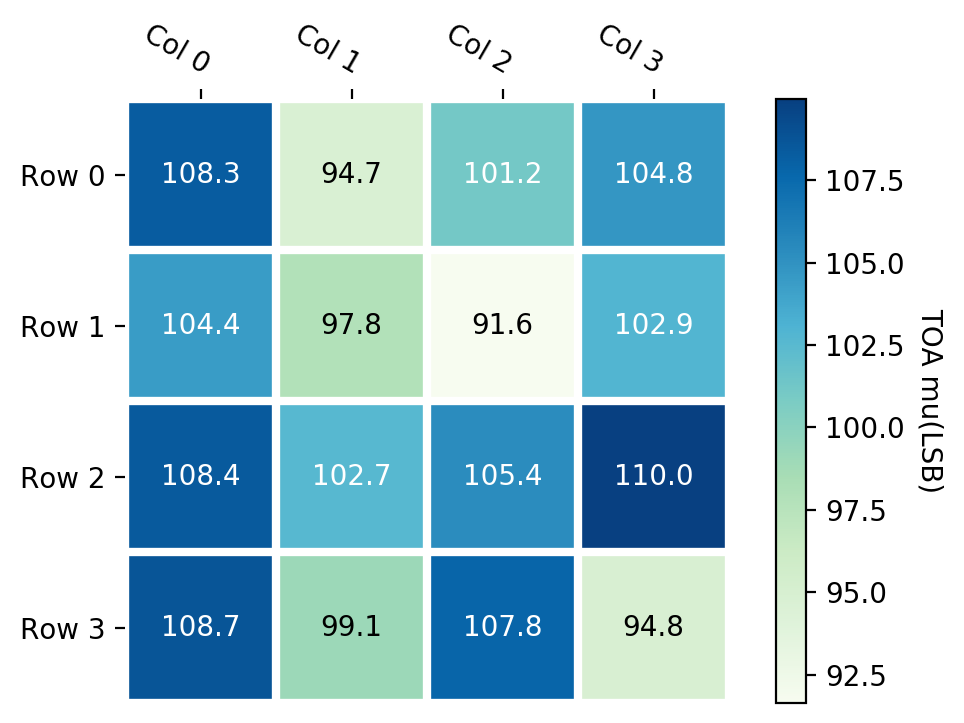

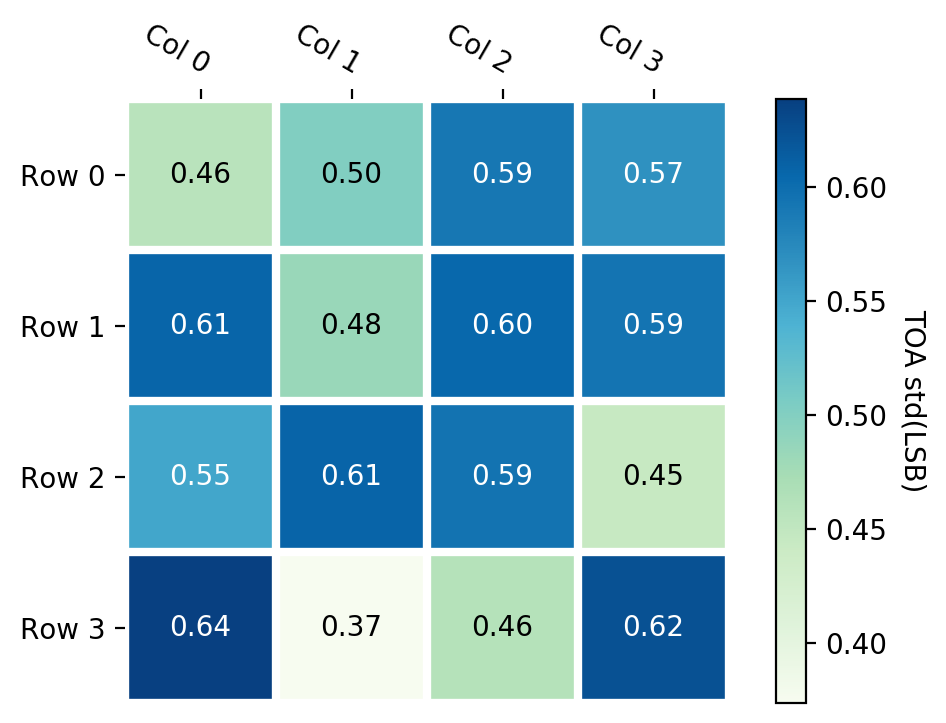

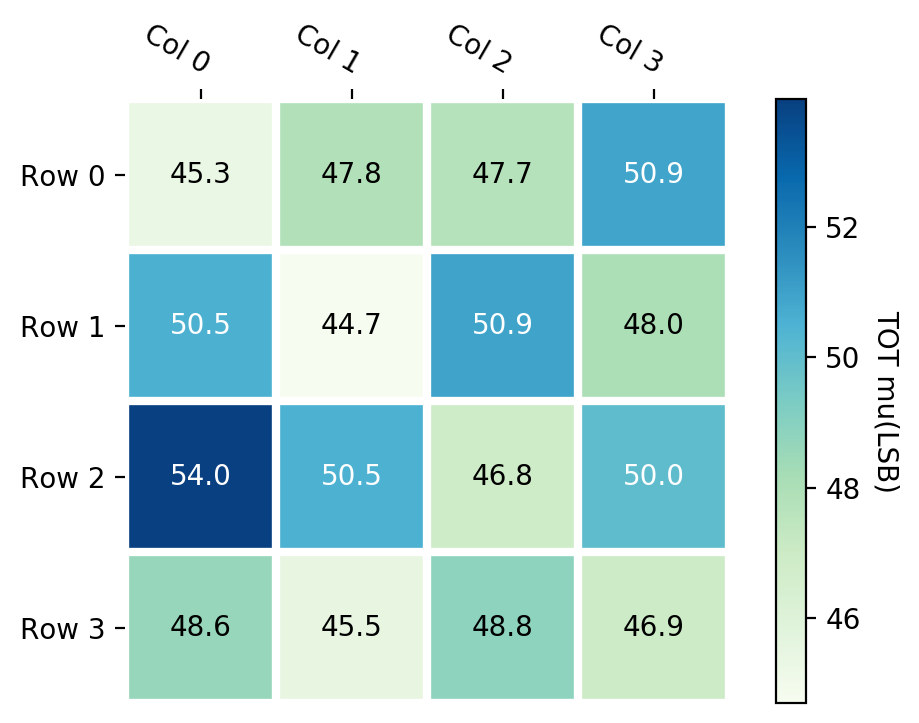

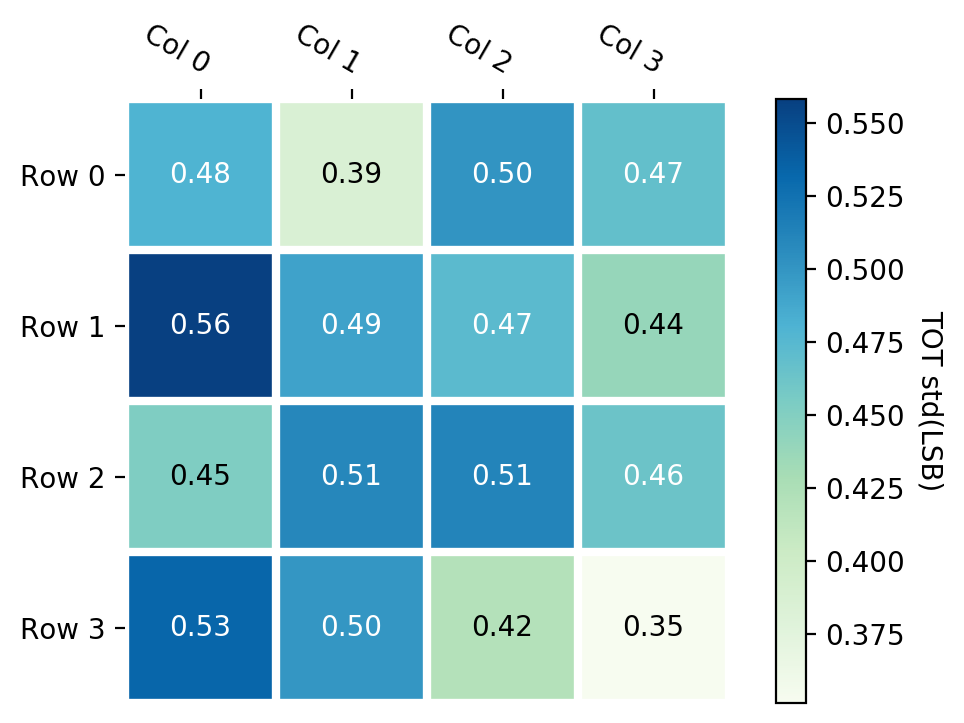

In [19]:
######## Plot 6 fC TOA heatmap ###############
import etroc1_array
row_heatmap = ['Row 0','Row 1','Row 2','Row 3']
col_heatmap = ['Col 0','Col 1','Col 2','Col 3']
toa_mu_heatmap=np.array([[toa_mu_rb_list[0][2][index_slice[0]], toa_mu_rb_list[4][2][index_slice[4]], toa_mu_rb_list[8][2][index_slice[8]], toa_mu_rb_list[12][2][index_slice[12]]],
                [toa_mu_rb_list[1][2][index_slice[1]], toa_mu_rb_list[5][2][index_slice[5]], toa_mu_rb_list[9][2][index_slice[9]], toa_mu_rb_list[13][2][index_slice[13]]],
                [toa_mu_rb_list[2][2][index_slice[2]], toa_mu_rb_list[6][2][index_slice[6]], toa_mu_rb_list[10][2][index_slice[10]], toa_mu_rb_list[14][2][index_slice[14]]],
                [toa_mu_rb_list[3][2][index_slice[3]], toa_mu_rb_list[7][2][index_slice[7]], toa_mu_rb_list[11][2][index_slice[11]], toa_mu_rb_list[15][2][index_slice[15]]]])

fig1, ax = plt.subplots(dpi=200)

im, cbar = etroc1_array.heatmap(toa_mu_heatmap, row_heatmap, col_heatmap, ax=ax,
                   cmap="GnBu", cbarlabel="TOA mu(LSB)")
texts = etroc1_array.annotate_heatmap(im, valfmt="{x:.1f}")

fig.tight_layout()
plt.show()
plt.close(fig1)

toa_std_heatmap=np.array(
               [[toa_std_rb_list[0][2][index_slice[0]], toa_std_rb_list[4][2][index_slice[4]], toa_std_rb_list[8][2][index_slice[8]], toa_std_rb_list[12][2][index_slice[12]]],
                [toa_std_rb_list[1][2][index_slice[1]], toa_std_rb_list[5][2][index_slice[5]], toa_std_rb_list[9][2][index_slice[9]], toa_std_rb_list[13][2][index_slice[13]]],
                [toa_std_rb_list[2][2][index_slice[2]], toa_std_rb_list[6][2][index_slice[6]], toa_std_rb_list[10][2][index_slice[10]], toa_std_rb_list[14][2][index_slice[14]]],
                [toa_std_rb_list[3][2][index_slice[3]], toa_std_rb_list[7][2][index_slice[7]], toa_std_rb_list[11][2][index_slice[11]], toa_std_rb_list[15][2][index_slice[15]]]])

fig1, ax = plt.subplots(dpi=200)

im, cbar = etroc1_array.heatmap(toa_std_heatmap, row_heatmap, col_heatmap, ax=ax,
                   cmap="GnBu", cbarlabel="TOA std(LSB)")
texts = etroc1_array.annotate_heatmap(im, valfmt="{x:.2f}")

fig.tight_layout()
plt.show()
plt.close(fig1)


######## Plot 6 fC TOT heatmap ###############
import etroc1_array
row_heatmap = ['Row 0','Row 1','Row 2','Row 3']
col_heatmap = ['Col 0','Col 1','Col 2','Col 3']
tot_mu_heatmap=np.array([[tot_mu_rb_list[0][2][index_slice[0]], tot_mu_rb_list[4][2][index_slice[4]], tot_mu_rb_list[8][2][index_slice[8]], tot_mu_rb_list[12][2][index_slice[12]]],
                [tot_mu_rb_list[1][2][index_slice[1]], tot_mu_rb_list[5][2][index_slice[5]], tot_mu_rb_list[9][2][index_slice[9]], tot_mu_rb_list[13][2][index_slice[13]]],
                [tot_mu_rb_list[2][2][index_slice[2]], tot_mu_rb_list[6][2][index_slice[6]], tot_mu_rb_list[10][2][index_slice[10]], tot_mu_rb_list[14][2][index_slice[14]]],
                [tot_mu_rb_list[3][2][index_slice[3]], tot_mu_rb_list[7][2][index_slice[7]], tot_mu_rb_list[11][2][index_slice[11]], tot_mu_rb_list[15][2][index_slice[15]]]])

fig1, ax = plt.subplots(dpi=200)

im, cbar = etroc1_array.heatmap(tot_mu_heatmap, row_heatmap, col_heatmap, ax=ax,
                   cmap="GnBu", cbarlabel="TOT mu(LSB)")
texts = etroc1_array.annotate_heatmap(im, valfmt="{x:.1f}")

fig.tight_layout()
plt.show()
plt.close(fig1)

tot_std_heatmap=np.array(
               [[tot_std_rb_list[0][2][index_slice[0]], tot_std_rb_list[4][2][index_slice[4]], tot_std_rb_list[8][2][index_slice[8]], tot_std_rb_list[12][2][index_slice[12]]],
                [tot_std_rb_list[1][2][index_slice[1]], tot_std_rb_list[5][2][index_slice[5]], tot_std_rb_list[9][2][index_slice[9]], tot_std_rb_list[13][2][index_slice[13]]],
                [tot_std_rb_list[2][2][index_slice[2]], tot_std_rb_list[6][2][index_slice[6]], tot_std_rb_list[10][2][index_slice[10]], tot_std_rb_list[14][2][index_slice[14]]],
                [tot_std_rb_list[3][2][index_slice[3]], tot_std_rb_list[7][2][index_slice[7]], tot_std_rb_list[11][2][index_slice[11]], tot_std_rb_list[15][2][index_slice[15]]]])

fig1, ax = plt.subplots(dpi=200)

im, cbar = etroc1_array.heatmap(tot_std_heatmap, row_heatmap, col_heatmap, ax=ax,
                   cmap="GnBu", cbarlabel="TOT std(LSB)")
texts = etroc1_array.annotate_heatmap(im, valfmt="{x:.2f}")

fig.tight_layout()
plt.show()
plt.close(fig1)